# Tornado Alley Climate Model

Here we take general climatic information as well as a dataset of all tornadoes in the US, building a model to use the former to predict some aspects of the distribution of the latter.

# Initialization

This section must be run first before applying any of the subsequent sections.

### Initial Imports and Loading US Geographical Information

In [28]:
import pandas as pd
import geopandas as gpd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [29]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV

In [30]:
states = gpd.read_file('../cb_2024_us_state_5m.zip')
states_to_remove = ['VI', 'MP', 'AK','HI','PR','AS', 'GU']
states = states[~states['STUSPS'].isin(states_to_remove)]

## Setting up the Climate Data

### Importing Climate Data and Selecting Feature Columns

In [31]:
climate_df = pd.read_csv('../data_download/yearly_climate_data.csv')

climate_df

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CDSD,CLDD,DP01,DP10,DP1X,...,TAVG,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,DYTS
0,2009,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",184.3,184.3,115.0,54.0,1.0,...,6.26,12.07,0.45,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2010,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",344.1,344.1,95.0,61.0,7.0,...,7.32,12.91,1.72,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2011,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",370.3,370.3,98.0,52.0,5.0,...,7.12,13.00,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2012,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",538.1,538.1,NaN,NaN,NaN,...,9.75,16.33,3.17,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2013,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",366.8,366.8,120.0,41.0,3.0,...,6.34,12.06,0.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
689147,2020,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",598.1,598.1,84.0,53.0,4.0,...,11.14,17.23,5.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN
689148,2021,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",668.7,668.7,73.0,45.0,11.0,...,11.71,17.83,5.58,NaN,NaN,NaN,NaN,NaN,NaN,NaN
689149,2022,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",724.6,724.6,73.0,40.0,6.0,...,11.04,18.11,3.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN
689150,2023,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",662.8,662.8,79.0,49.0,6.0,...,11.93,18.53,5.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
test_years = list(range(1980,1990)) + list(range(2020,2025))

features_to_interpolate = climate_df.columns[5:-1]
redundant_features = ['CDSD','HDSD','TAVG']
special_attributes = ['EMNT', 'EMXP', 'EMXT', 'EMSD', 'EMSN'] # The attributes for these features have extra, and potentially useful, information that we would need to handle with some care
date_features = ['FZF0', 'FZF1', 'FZF2', 'FZF3', 'FZF4', 'FZF5', 'FZF6', 'FZF7', 'FZF8', 'FZF9'] # The values for these features are dates, so we would need to handle them separately
features_to_interpolate = features_to_interpolate.drop(redundant_features)
#features_to_interpolate = features_to_interpolate.drop(special_attributes)
features_to_interpolate = features_to_interpolate.drop(date_features)

reduced_climate_df = pd.concat([climate_df[['DATE','LATITUDE','LONGITUDE','ELEVATION','NAME']],climate_df[features_to_interpolate]],axis=1)


features_to_interpolate = list(features_to_interpolate)
features_to_interpolate

['CLDD',
 'DP01',
 'DP10',
 'DP1X',
 'DT00',
 'DT32',
 'DX32',
 'DX70',
 'DX90',
 'EMNT',
 'EMXP',
 'EMXT',
 'HTDD',
 'PRCP',
 'TMAX',
 'TMIN',
 'DSND',
 'DSNW',
 'EMSD',
 'EMSN',
 'SNOW',
 'DYFG']

### Interpolation to Fill in Missing Values

In [33]:
from data_interpolation import *
reduced_climate_df = remove_nans_interpolator(reduced_climate_df,'LATITUDE','LONGITUDE',features_to_interpolate,'DATE',reduced_climate_df['DATE'].unique())

### Interpolation to Bring Data to a Grid

This won't immediately be used, but we will later have need to convert our irregularly spaced weather data into data on a uniform grid.

In [34]:
from interpolate_to_grid import *

### Code to Create Test Splits

We'll need to separate our data for training and testing our model. This is made somewhat tricky by the fact that most (almost all) weather stations do not report values for all of our attributes, so that values of attributes will need to be determined by interpolation. As such, we'll be doing the following:
* The years 1980-1989 and 2020-2024, inclusive, are to be designated as testing years. All data from these years will be set aside.
* Of the remaining years 1950-1980 and 1990-2020, we'll perform cross validation splits by removing a single decade at a time.

In [35]:
from create_test_splits import *

## Preprocessing the Tornado Data

### Defining Tornado Alley Using A Rescaled KDE

We find it most convenient to group tornado data together into bins of 5 years, associating all 5 of those years with the corresponding distribution

In [36]:
tornado_df = pd.read_csv('../data_download/all_tornadoes.csv')
# There are a very small subset (about 35) of strong tornadoes not having longitude or latitude values. These are removed now.
tornado_df = tornado_df[~tornado_df['begin_lat'].isnull()]
tornado_df = tornado_df[~tornado_df['begin_lon'].isnull()]

# Now, we also restrict ourselves to only working with strong tornadoes.
tornado_df = tornado_df[tornado_df['tor_f_scale'].isin(['F3','F4','F5'])]

def bin_by_year(year):
    return 1950 + ((year-1950) // 5) * 5

tornado_df.loc[:,'year_bin'] = bin_by_year(tornado_df['year'])

tornado_df

,Unnamed: 0,state,begin_lat,begin_lon,tor_f_scale,year,year_bin
0,0,OKLAHOMA,35.1200,-99.2000,F3,1950,1950
6,6,PENNSYLVANIA,40.2000,-76.1200,F3,1950,1950
7,7,PENNSYLVANIA,40.2700,-76.0700,F3,1950,1950
16,16,OKLAHOMA,34.8800,-99.2800,F3,1950,1950
17,17,OKLAHOMA,35.0000,-99.2000,F3,1950,1950
...,...,...,...,...,...,...,...
72427,75183,MISSISSIPPI,31.3773,-90.8606,F3,2024,2020
72509,75270,OKLAHOMA,35.3640,-97.4380,F3,2024,2020
72516,75277,OKLAHOMA,34.2910,-97.9690,F3,2024,2020
72526,75288,OKLAHOMA,35.4000,-97.2420,F3,2024,2020


To proceed, we will need a definition of Tornado Alley. No standard formal definition exists, so we'll work with the following idea:

_Tornado Alley consists of the portions of the US in which strong tornadoes (F3 or higher) occur with the highest frequency._

To obtain such a region we'll use a KDE method to mollify the empirical distribution of tornadoes. 

In [37]:
from kde_generation import *

In using a KDE to define Tornado Alley, we have two highly significant parameters:
* The **bandwidth of the KDE**. A float, this parameter affects how wide a region around a given tornado is allocated 'tornado frequency' points from that tornado.
* The **quantile to remove**. A float between 0 and 1, this is the fraction of yearly tornadoes we'll allow into the KDE. We compute the mean tornado position and the distance of every tornado from that position. Those tornadoes which are furthest from the center are excluded from analysis. This is done to remove the small number of tornadoes which irregularly occur in unusual portions of the country, so as to reduce the variability of the data.

These values here are just sample values, we'll choose these parameters in the relevant sections of this notebook.

In [38]:
BANDWIDTH = .5
QUANTILE_TO_REMOVE = .5

In [39]:
years = np.arange(1950,2025,5)

tornado_kdes = yearly_tornado_distributions(tornado_df, BANDWIDTH, years, QUANTILE_TO_REMOVE)

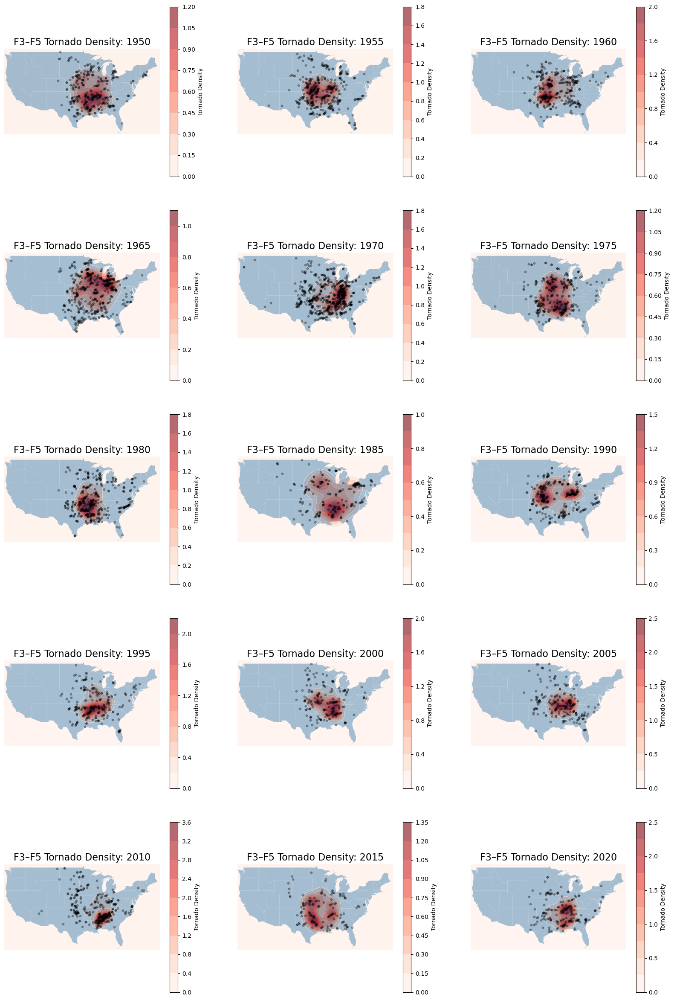

In [40]:
 ## This code block draws a contour plot of the mollified empirical distribution for some selected years, for visualization's sake.

years = np.arange(1950,2025,5)

fig, axs = plt.subplots(5,3)
fig.set_size_inches(20,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    plot_x = ((year - 1950) // 5) % 3
    plot_y = ((year - 1950) // 5) // 3

    density = tornado_kdes(year,positions).reshape(xx.shape)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, density, levels=10, cmap='Reds', alpha=0.6)

    plt.colorbar(contour, ax=ax, label='Tornado Density')

    tornado_x = tornado_df[tornado_df['year_bin']==year]['begin_lon'].values
    tornado_y = tornado_df[tornado_df['year_bin']==year]['begin_lat'].values
    ax.scatter(tornado_x, tornado_y, c='black', s=10, alpha=0.3)

    ax.set_title("F3–F5 Tornado Density: " + str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

# Modeling

Each top-level subsection below can be run independently of the others.

## Understanding Tornado Alley as a Regression Problem

### Generating the KDE

First, our two constants needed to define the KDE.

In [13]:
BANDWIDTH = .5
QUANTILE_TO_REMOVE = .9

The 'years' variable below will ultimately serve as bins. A single KDE will be computed for all tornadoes within a bin.

In [14]:
years = np.arange(1950,2025,5)
tornado_kdes = yearly_tornado_distributions(tornado_df, BANDWIDTH, years, QUANTILE_TO_REMOVE)

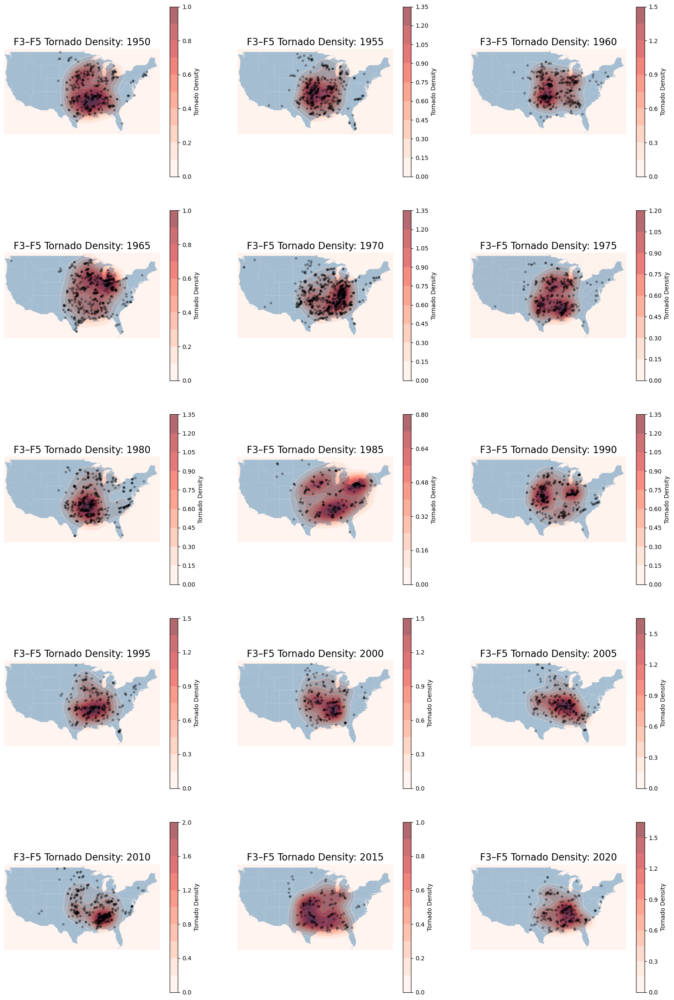

In [15]:
 ## This code block draws a contour plot of the mollified empirical distribution for some selected years, for visualization's sake.

years = np.arange(1950,2025,5)

fig, axs = plt.subplots(5,3)
fig.set_size_inches(20,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    plot_x = ((year - 1950) // 5) % 3
    plot_y = ((year - 1950) // 5) // 3

    density = tornado_kdes(year,positions).reshape(xx.shape)
    #tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, density, levels=10, cmap='Reds', alpha=0.6)


    #xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    #positions = np.vstack([xx.ravel(), yy.ravel()])
    #density = tornado_kdes(year,positions).reshape(xx.shape)

    
    #contour = ax.contourf(xx, yy, density, levels=10, cmap='Reds', alpha=0.6)
    plt.colorbar(contour, ax=ax, label='Tornado Density')

    tornado_x = tornado_df[tornado_df['year_bin']==year]['begin_lon'].values
    tornado_y = tornado_df[tornado_df['year_bin']==year]['begin_lat'].values
    ax.scatter(tornado_x, tornado_y, c='black', s=10, alpha=0.3)

    ax.set_title("F3–F5 Tornado Density: " + str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

### Labeling the Climate Data

In [16]:
def tornado_alley_kde_calc(row):
    return tornado_kdes(row['DATE'],[row['LONGITUDE'],row['LATITUDE']])[0]

In [17]:
kde_climate_df = reduced_climate_df.copy()

kde_climate_df['tornado_alley'] = kde_climate_df.apply(tornado_alley_kde_calc, axis=1)
kde_climate_df = kde_climate_df.reset_index(drop=True)

kde_climate_df

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,PRCP,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley
0,2009,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",184.3,115.000000,54.000000,1.000000,3.400000e+01,...,549.700000,12.07,0.45,74.359960,17.120770,457.732142,244.172037,1250.019578,125.573979,0.16689
1,2010,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",344.1,95.000000,61.000000,7.000000,3.200000e+01,...,755.100000,12.91,1.72,98.630914,14.044279,540.627510,125.195027,1069.114304,123.694906,0.29944
2,2011,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",370.3,98.000000,52.000000,5.000000,3.200000e+01,...,632.000000,13.00,1.25,77.418384,10.448963,380.011789,167.381565,913.196317,95.814395,0.29944
3,2012,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",538.1,72.352762,45.921186,3.005618,1.500000e+01,...,557.206593,16.33,3.17,47.831783,8.680312,191.239107,162.175092,763.400547,49.826326,0.29944
4,2013,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",366.8,120.000000,41.000000,3.000000,2.600000e+01,...,547.500000,12.06,0.62,95.901032,16.733666,202.638958,208.159867,1314.865050,66.351549,0.29944
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680148,2020,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",598.1,84.000000,53.000000,4.000000,3.000000e+00,...,686.000000,17.23,5.04,36.304437,11.311418,137.144087,123.221535,708.395364,69.526786,0.47330
680149,2021,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",668.7,73.000000,45.000000,11.000000,1.000000e+01,...,792.600000,17.83,5.58,41.267275,8.655709,358.344341,302.375452,839.814951,72.985282,0.47330
680150,2022,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",724.6,73.000000,40.000000,6.000000,1.300000e+01,...,493.300000,18.11,3.98,13.967127,3.058600,67.107032,63.092740,189.364304,38.832051,0.47330
680151,2023,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",662.8,79.000000,49.000000,6.000000,-5.273559e-16,...,611.500000,18.53,5.33,19.875558,5.118656,187.116457,201.823838,496.002090,72.470351,0.47330


It's worth noting the manner in which the data is skewed toward lower values. The two blocks below show the relative sizes of the number of rows with large predictions vs the number of rows with small predictions. This will ultimately cause issues with the analysis.

In [18]:
kde_climate_df[kde_climate_df['tornado_alley'] > .5]

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,PRCP,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley
11,2010,40.5093,-98.5493,601.1,"JUNIATA 6.0 SSW, NE US",622.394367,89.000000,55.000000,7.000000,5.645935,...,854.000000,16.746180,4.401367,46.531033,2.630865,333.123339,34.806128,145.204262,126.335552,0.511174
12,2011,40.5093,-98.5493,601.1,"JUNIATA 6.0 SSW, NE US",604.751355,90.000000,54.000000,9.000000,12.186584,...,813.300000,16.754741,3.621605,57.532444,4.228695,298.604715,195.570580,457.470610,115.716363,0.511174
13,2012,40.5093,-98.5493,601.1,"JUNIATA 6.0 SSW, NE US",728.499665,54.000000,31.000000,6.000000,4.478715,...,499.300000,19.714509,4.666408,27.140724,0.704922,273.016838,149.996194,174.858100,61.010559,0.511174
14,2013,40.5093,-98.5493,601.1,"JUNIATA 6.0 SSW, NE US",633.644120,77.000000,46.000000,7.000000,5.083088,...,727.900000,16.583687,3.508234,43.425275,1.878817,268.858922,74.986406,145.779884,70.073363,0.511174
15,2014,40.5093,-98.5493,601.1,"JUNIATA 6.0 SSW, NE US",549.887315,80.000000,39.000000,7.000000,11.603851,...,668.400000,16.880374,3.433207,28.886969,3.818082,91.007449,45.796990,196.598079,77.114574,0.511174
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680138,2010,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",621.600000,103.000000,58.000000,8.000000,9.000000,...,777.000000,16.220000,4.770000,64.451310,6.190403,332.821653,68.517987,312.540423,128.825619,0.523202
680139,2011,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",619.400000,99.000000,55.000000,8.000000,7.000000,...,783.500000,16.720000,4.590000,49.577152,7.853125,188.167159,107.665236,593.227496,125.382257,0.523202
680140,2012,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",783.800000,62.000000,36.000000,4.000000,3.000000,...,493.100000,19.740000,5.790000,28.104832,2.889470,202.460964,183.481337,309.173277,17.291844,0.523202
680141,2013,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",602.400000,70.931012,46.464850,7.777856,5.000000,...,733.677691,16.310000,3.960000,34.734965,5.778940,152.000000,137.972187,548.276910,19.266116,0.523202


In [19]:
kde_climate_df[kde_climate_df['tornado_alley'] <= .5]

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,PRCP,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley
0,2009,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",184.3,115.000000,54.000000,1.000000,3.400000e+01,...,549.700000,12.07,0.45,74.359960,17.120770,457.732142,244.172037,1250.019578,125.573979,0.16689
1,2010,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",344.1,95.000000,61.000000,7.000000,3.200000e+01,...,755.100000,12.91,1.72,98.630914,14.044279,540.627510,125.195027,1069.114304,123.694906,0.29944
2,2011,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",370.3,98.000000,52.000000,5.000000,3.200000e+01,...,632.000000,13.00,1.25,77.418384,10.448963,380.011789,167.381565,913.196317,95.814395,0.29944
3,2012,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",538.1,72.352762,45.921186,3.005618,1.500000e+01,...,557.206593,16.33,3.17,47.831783,8.680312,191.239107,162.175092,763.400547,49.826326,0.29944
4,2013,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",366.8,120.000000,41.000000,3.000000,2.600000e+01,...,547.500000,12.06,0.62,95.901032,16.733666,202.638958,208.159867,1314.865050,66.351549,0.29944
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680148,2020,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",598.1,84.000000,53.000000,4.000000,3.000000e+00,...,686.000000,17.23,5.04,36.304437,11.311418,137.144087,123.221535,708.395364,69.526786,0.47330
680149,2021,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",668.7,73.000000,45.000000,11.000000,1.000000e+01,...,792.600000,17.83,5.58,41.267275,8.655709,358.344341,302.375452,839.814951,72.985282,0.47330
680150,2022,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",724.6,73.000000,40.000000,6.000000,1.300000e+01,...,493.300000,18.11,3.98,13.967127,3.058600,67.107032,63.092740,189.364304,38.832051,0.47330
680151,2023,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",662.8,79.000000,49.000000,6.000000,-5.273559e-16,...,611.500000,18.53,5.33,19.875558,5.118656,187.116457,201.823838,496.002090,72.470351,0.47330


### Some Initial Analysis and Model Selection

A number of different models were attempted with the data. Nonlinear models had the most success. We highlight a few of these here along with their mean absolute error for cross validation data.

In [20]:
from sklearn.metrics import mean_squared_error,mean_absolute_error

features = features_to_interpolate

There's relatively little reason to think that a linear regression model will be sufficient as a predictor. Nonetheless, it's worth trying.

In [21]:
from sklearn.linear_model import Ridge
from sklearn.kernel_approximation import RBFSampler

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
ridge_ker_pipe = make_pipeline(StandardScaler(),RBFSampler(gamma = .02),Ridge(alpha = .5))
ridge_ker_scores = cross_val_score(ridge_ker_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='neg_mean_absolute_error')
print(ridge_ker_scores)

[-0.15141929 -0.15670013 -0.15498267 -0.15644499 -0.15701269 -0.1592943 ]


In [22]:
from sklearn.svm import LinearSVR

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
svr_pipe = make_pipeline(StandardScaler(),RBFSampler(gamma = .1),LinearSVR(epsilon=0.001,C=1))
svr_scores = cross_val_score(svr_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='neg_mean_absolute_error')
print(svr_scores)

[-0.15564871 -0.15276498 -0.1667475  -0.15709643 -0.16312515 -0.15058976]


In [23]:
from sklearn.neighbors import KNeighborsRegressor

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
knr_pipe = make_pipeline(StandardScaler(),KNeighborsRegressor(n_neighbors=11))
knr_scores = cross_val_score(knr_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='neg_mean_absolute_error')
print(knr_scores)

[-0.13353843 -0.13791282 -0.13922516 -0.12587776 -0.12733912 -0.13224663]


The Gradient Boosting Regressor performed even better than kNN, but concerns about overfitting led us to use the kNN model anyway.

In [25]:
from sklearn.ensemble import HistGradientBoostingRegressor

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
grad_pipe = make_pipeline(HistGradientBoostingRegressor(learning_rate=.1,l2_regularization=1))
grad_scores = cross_val_score(grad_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='neg_mean_absolute_error')
print(grad_scores)

[-0.12496398 -0.1299528  -0.12940335 -0.12044309 -0.12425581 -0.13516779]


### Optimizing the Parameters of kNN Regression

Having decided to use kNN Regression, we use cross validation to determine the right number of neighbors to achieve the best fit.

In [24]:
mean_scores = []
for i in range(5,15):
    train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
    knr_pipe = make_pipeline(StandardScaler(),KNeighborsRegressor(n_neighbors=i))
    knr_scores = cross_val_score(knr_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='neg_mean_absolute_error')
    print(str(i) + " neighbors model completed.")
    mean_scores.append(np.mean(knr_scores))

5 neighbors model completed.
6 neighbors model completed.
7 neighbors model completed.
8 neighbors model completed.
9 neighbors model completed.
10 neighbors model completed.
11 neighbors model completed.
12 neighbors model completed.
13 neighbors model completed.
14 neighbors model completed.


In [28]:
for i in range(15,20):
    train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
    knr_pipe = make_pipeline(StandardScaler(),KNeighborsRegressor(n_neighbors=i))
    knr_scores = cross_val_score(knr_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='neg_mean_absolute_error')
    print(str(i) + " neighbors model completed.")
    mean_scores.append(np.mean(knr_scores))

15 neighbors model completed.
16 neighbors model completed.
17 neighbors model completed.
18 neighbors model completed.
19 neighbors model completed.


Concerns about overfitting and the run-time of the model will prevent us from using more than 19 neighbors.

In [29]:
np.argmax(mean_scores) + 5

np.int64(19)

### Some Visualization for the Selected Model Applied to Cross Validation Data

To manipulate the cross validation predicted data most effectively, we generate the dataframe 'predictions_df'. This dataframe contains only data in non-testing years (1950-1980 and 1990-2020), with each decade inserted from the cross validation set in which that decade makes up the testing data. As such, this data contains all cross validation test data we can work with.

In [31]:
num_neighbors = 19
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)


predictions = []
for train_indices, test_indices in cv_splits:
    pipe = make_pipeline(StandardScaler(),KNeighborsRegressor(n_neighbors=num_neighbors))

    train_data = remaining_kde_df.iloc[train_indices].copy()
    test_data = remaining_kde_df.iloc[test_indices].copy()

    pipe.fit(train_data[features],train_data['tornado_alley'])
    test_predicts = pipe.predict(test_data[features])

    #test_data['predictions'] = test_predicts
    test_data['predictions'] = test_predicts

    predictions.append(test_data)

predictions_df = pd.concat(predictions,axis=0)

In [32]:
predictions_df

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley,predictions
73244,1950,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1341.735086,104.000000,77.000000,14.000000,0.000000,...,26.067506,12.622880,0.000000,0.000000,0.000000,0.000000,0.000000,30.141174,0.398307,0.218052
73245,1957,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1311.032930,95.000000,77.000000,14.000000,0.000000,...,25.515139,13.456971,0.000000,0.000000,0.000000,0.000000,0.000000,32.607199,0.156458,0.292431
73246,1958,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1266.894815,90.000000,73.000000,13.000000,0.000000,...,24.575579,11.766309,1.000000,1.000000,25.000000,25.000000,25.000000,35.907665,0.156458,0.564971
73247,1959,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1297.643358,96.000000,79.000000,17.000000,0.000000,...,25.029862,12.686546,0.000000,0.000000,0.000000,0.000000,0.000000,10.541029,0.156458,0.522001
73322,1950,34.41667,-87.31667,302.1,"ADDISON CENTRAL TOWER, AL US",935.780952,124.129893,83.896073,19.342884,0.000000,...,21.841915,10.787106,1.000000,1.000000,76.000000,76.000000,76.000000,62.732118,0.754171,0.487286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680143,2015,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",571.700000,109.000000,67.000000,10.000000,10.000000,...,17.670000,5.470000,21.728947,3.737868,257.913558,70.422663,267.688305,76.145173,0.488862,0.593791
680144,2016,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",654.100000,87.000000,52.000000,9.000000,6.000000,...,18.360000,6.310000,24.618878,4.831510,183.668195,155.904403,526.851372,70.522834,0.488862,0.615091
680145,2017,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",579.400000,84.000000,57.000000,9.000000,6.000000,...,17.980000,5.540000,15.519591,3.943548,92.827091,83.822394,258.722362,57.792966,0.488862,0.588461
680146,2018,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",651.000000,103.000000,66.000000,9.000000,7.000000,...,16.170000,4.380000,50.084134,13.723489,142.883543,162.080228,1060.386763,78.184530,0.488862,0.636622


Processing year 1950
Processing year 1960
Processing year 1970
Processing year 1980
Processing year 1990
Processing year 2000
Processing year 2010
Processing year 2020


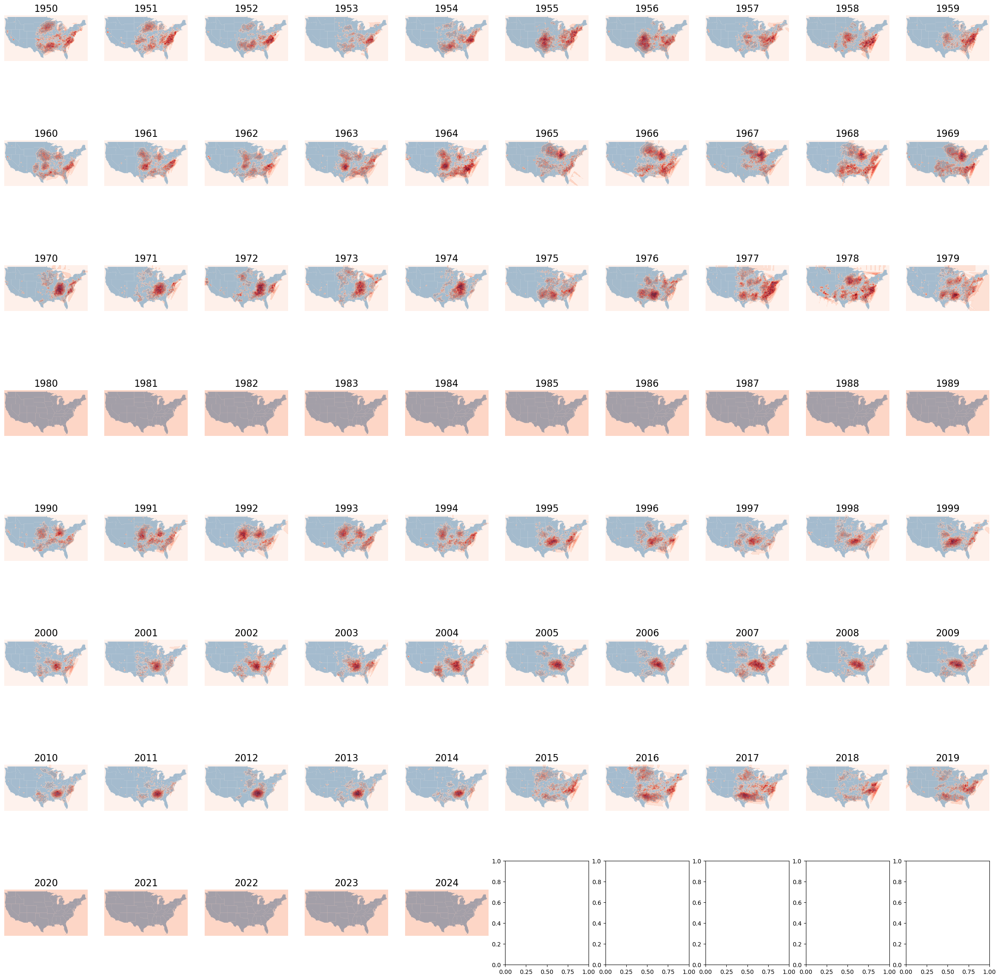

In [35]:
years = np.arange(1950,2025,1)

fig, axs = plt.subplots(8,10)
fig.set_size_inches(30,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

grid_pred_df = predictions_to_grid(predictions_df,positions.transpose(),predictions_df['DATE'].unique(),'predictions')
grid_truth_df = predictions_to_grid(predictions_df,positions.transpose(),predictions_df['DATE'].unique(),'tornado_alley')

for year in years:
    if year % 10 == 0:
        print('Processing year ' + str(year))
    plot_x = (year - 1950) % 10
    plot_y = (year - 1950) // 10

    year_preds = np.zeros(xx.shape)
    year_truth = np.zeros(xx.shape)

    year_pred_df = grid_pred_df[grid_pred_df['DATE'] == year]
    year_truth_df = grid_truth_df[grid_truth_df['DATE'] == year]
    if year_pred_df.shape[0] != 0:
        year_preds = np.array(year_pred_df['preds']).reshape(xx.shape)
        year_truth = np.array(year_truth_df['preds']).reshape(xx.shape)

    error = np.abs(year_preds - year_truth)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, error, cmap='Reds', alpha=0.6)

    ax.set_title(str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

### The Main Train-Test Split

Moving past cross validation, we examine the model's behavior when trained on the entire testing set, and we'll examine the predicted values in the 1980s and 2020-2024.

In [36]:
num_neighbors = 19
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features_to_interpolate)

knn_pipe = make_pipeline(StandardScaler(),KNeighborsRegressor(n_neighbors=num_neighbors))
knn_pipe.fit(train_df[features],train_df['tornado_alley'])
test_predicts = knn_pipe.predict(test_df[features])
test_df['predictions'] = test_predicts

predictions_df = test_df.copy()

C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_35800\3711152813.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['predictions'] = test_predicts


Processing year 1950
Processing year 1960
Processing year 1970
Processing year 1980
Processing year 1990
Processing year 2000
Processing year 2010
Processing year 2020


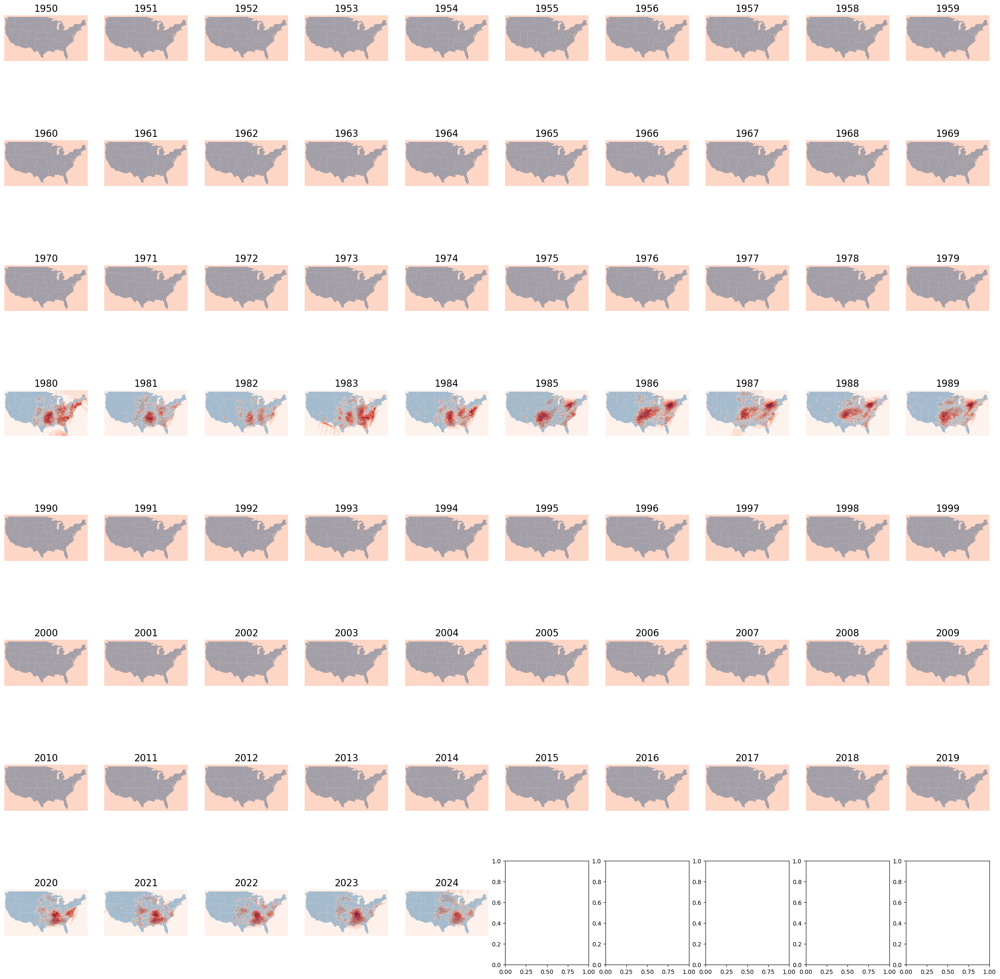

In [38]:
years = np.arange(1950,2025,1)

fig, axs = plt.subplots(8,10)
fig.set_size_inches(30,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

grid_pred_df = predictions_to_grid(predictions_df,positions.transpose(),predictions_df['DATE'].unique(),'predictions')
grid_truth_df = predictions_to_grid(predictions_df,positions.transpose(),predictions_df['DATE'].unique(),'tornado_alley')

for year in years:
    if year % 10 == 0:
        print('Processing year ' + str(year))
    plot_x = (year - 1950) % 10
    plot_y = (year - 1950) // 10

    year_preds = np.zeros(xx.shape)
    year_truth = np.zeros(xx.shape)

    year_pred_df = grid_pred_df[grid_pred_df['DATE'] == year]
    year_truth_df = grid_truth_df[grid_truth_df['DATE'] == year]
    if year_pred_df.shape[0] != 0:
        year_preds = np.array(year_pred_df['preds']).reshape(xx.shape)
        year_truth = np.array(year_truth_df['preds']).reshape(xx.shape)

    error = np.abs(year_preds - year_truth)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, error, cmap='Reds', alpha=0.6)

    ax.set_title(str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

This code generates images displaying in greater detail the quality of the result for each of the test years.

In [39]:
def ground_truth_regression_plot(predict_df,year,grid_xx,grid_yy,density,ax):
    states.plot(ax=ax)

    ax.contourf(grid_xx, grid_yy, density, levels=10, cmap='Reds', alpha=0.6)
    plt.colorbar(contour, ax=ax)

    ax.set_title(str(year) + " Estimated F3-F5 Tornado Density", fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    return ax

def predict_tornado_alley_regression_plot(grid_predict_df,grid_truth_df,year,grid_xx,grid_yy,grid_positions,ax):
    year_pred_df = grid_predict_df[grid_predict_df['DATE'] == year]

    year_preds = np.array(year_pred_df['preds']).reshape(grid_xx.shape)

    states.plot(ax=ax)

    contour = ax.contourf(grid_xx, grid_yy, year_preds, cmap='Reds', alpha=0.6)
    plt.colorbar(contour, ax=ax)

    ax.set_title(str(year) + ' Predicted Tornado Density', fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    return ax


def error_tornado_alley_regression_plot(grid_predict_df,grid_truth_df,year,grid_xx,grid_yy,grid_positions,ax):
    year_pred_df = grid_predict_df[grid_predict_df['DATE'] == year]
    year_truth_df = grid_truth_df[grid_truth_df['DATE'] == year]


    year_preds = np.array(year_pred_df['preds']).reshape(grid_xx.shape)
    year_truth = np.array(year_truth_df['preds']).reshape(grid_xx.shape)

    error = np.abs(year_preds - year_truth)

    states.plot(ax=ax)

    contour = ax.contourf(grid_xx, grid_yy, error, cmap='Reds', alpha=0.6)
    plt.colorbar(contour, ax=ax)

    ax.set_title(str(year) + ' Errors in Predictions', fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    return ax

def regression_year_plot(predict_df,year,grid_xx,grid_yy,grid_positions):
    
    density = tornado_kdes(year,grid_positions).reshape(grid_xx.shape)

    ground_truth_regression_plot(predict_df,year,grid_xx,grid_yy,density,axs[0])

    grid_pred_df = predictions_to_grid(predict_df,positions.transpose(),[year],'predictions')
    grid_truth_df = predictions_to_grid(predict_df,positions.transpose(),[year],'tornado_alley')
    predict_tornado_alley_regression_plot(grid_pred_df,grid_truth_df,year,grid_xx,grid_yy,grid_positions,axs[1])
    error_tornado_alley_regression_plot(grid_pred_df,grid_truth_df,year,grid_xx,grid_yy,grid_positions,axs[2])

    return (fig, axs)

In [40]:
years = list(range(1980,1990)) + list(range(2020,2025))

plt.ioff()

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:200j, ymin:ymax:200j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    fig, axs = plt.subplots(1,3,figsize=(30,10))
    fig, axs = regression_year_plot(predictions_df, year, xx, yy, positions)
    fig.savefig('generated_images/regression_' + str(year) + '.png')

C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_35800\709994821.py:5: UserWarning: Adding colorbar to a different Figure <Figure size 3000x3000 with 80 Axes> than <Figure size 3000x1000 with 4 Axes> which fig.colorbar is called on.
  plt.colorbar(contour, ax=ax)
C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_35800\709994821.py:5: UserWarning: Adding colorbar to a different Figure <Figure size 3000x3000 with 80 Axes> than <Figure size 3000x1000 with 4 Axes> which fig.colorbar is called on.
  plt.colorbar(contour, ax=ax)
C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_35800\709994821.py:5: UserWarning: Adding colorbar to a different Figure <Figure size 3000x3000 with 80 Axes> than <Figure size 3000x1000 with 4 Axes> which fig.colorbar is called on.
  plt.colorbar(contour, ax=ax)
C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_35800\709994821.py:5: UserWarning: Adding colorbar to a different Figure <Figure size 3000x3000 with 80 Axes> than <Figure size

In [ ]:
plt.ion()
plt.show()

### Analyzing the Quality of the Result

Even before looking at the numbers, we can see some issues with our model's behavior. It _is_ successfully producing small errors across most of the country. Moreover, it is accurately suggesting that the Midwest and/or Southeast are at the highest risk. However, it's errors are dramatically larger than average in this region.

In [42]:
mean_squared_error(predictions_df['tornado_alley'],predictions_df['predictions'])

0.050921057811692136

In [43]:
mean_absolute_error(predictions_df['tornado_alley'],predictions_df['predictions'])

0.1386719203701973

Both of these values are fairly small, so it's not necessarily a bad model. On the other hand, we can restrict our attention to the points where the truth is large.

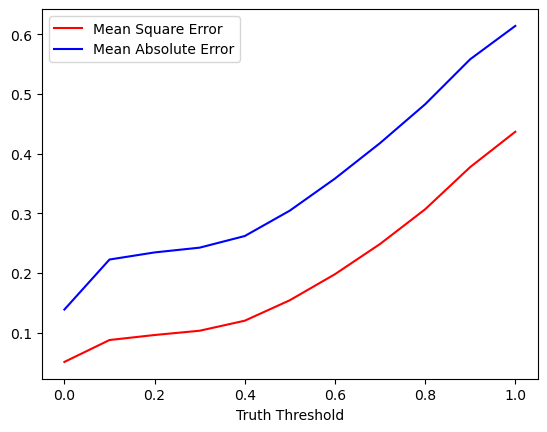

In [53]:
thresholds = np.linspace(0,1,11)
sq_errors = []
abs_errors = []
for val in thresholds:
    large_val_df = predictions_df[predictions_df['tornado_alley'] > val]
    sq_errors.append(mean_squared_error(large_val_df['tornado_alley'],large_val_df['predictions']))
    abs_errors.append(mean_absolute_error(large_val_df['tornado_alley'],large_val_df['predictions']))

plt.plot(thresholds,sq_errors,c='red',label='Mean Square Error')
plt.plot(thresholds,abs_errors,c='blue',label='Mean Absolute Error')
plt.xlabel('Truth Threshold')
plt.legend()
plt.show()

Notably, our model performs worse and worse as the threshold grows. There seem to be two reasons for this. 
* First, very little of the data has a high ground-truth value. As such, the regression model is strongly encouraged to be accurate for low ground-truth points and less strongly for high ground-truth points. Perhaps more heavily weighting points with high tornado risk could ameliorate this issue.
* Second, even with 5 year bins for the KDEs defining the ground truth values, there is fairly extreme variation in ground truth. Tornado occurences are highly variable, and there is a lot of complexity in the shape of the KDE for each bin. Our data does not seem to have sufficient predictive power to fully capture this complexity. To help mitigate this issue, we have the next section of the notebook.

## Simplifying to a Classification Problem

### Generating the KDE

We have our three constants needed for this section. The 'REQUIRED_FREQ' constant is a threshold value. Points whose KDE exceeds the threshold level of risk are considered to be within Tornado Alley.

In [41]:
BANDWIDTH = .5
QUANTILE_TO_REMOVE = .5

REQUIRED_FREQ = .5

In [42]:
years = np.arange(1950,2025,5)

tornado_kdes = yearly_tornado_distributions(tornado_df, BANDWIDTH, years, QUANTILE_TO_REMOVE)

### Labeling the Climate Data

In [43]:
def tornado_alley_classification(lat,lon,year):
    '''
        Given floats lat and lon representing the latitude and longitude of a point and an int year representing the year,
        outputs 1 if the point falls within tornado alley and a 0 otherwise.
    '''
    return int(tornado_kdes(year,[lon,lat])[0] > REQUIRED_FREQ)

def tornado_alley_calc(row):
    return tornado_alley_classification(row['LATITUDE'],row['LONGITUDE'],row['DATE'])

In [44]:
kde_climate_df = reduced_climate_df.copy()

kde_climate_df['tornado_alley'] = kde_climate_df.apply(tornado_alley_calc, axis=1)
kde_climate_df = kde_climate_df.reset_index(drop=True)

kde_climate_df

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,PRCP,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley
0,2009,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",184.3,115.000000,54.000000,1.000000,3.400000e+01,...,549.700000,12.07,0.45,74.359960,17.120770,457.732142,244.172037,1250.019578,125.573979,0
1,2010,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",344.1,95.000000,61.000000,7.000000,3.200000e+01,...,755.100000,12.91,1.72,98.630914,14.044279,540.627510,125.195027,1069.114304,123.694906,0
2,2011,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",370.3,98.000000,52.000000,5.000000,3.200000e+01,...,632.000000,13.00,1.25,77.418384,10.448963,380.011789,167.381565,913.196317,95.814395,0
3,2012,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",538.1,72.352762,45.921186,3.005618,1.500000e+01,...,557.206593,16.33,3.17,47.831783,8.680312,191.239107,162.175092,763.400547,49.826326,0
4,2013,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",366.8,120.000000,41.000000,3.000000,2.600000e+01,...,547.500000,12.06,0.62,95.901032,16.733666,202.638958,208.159867,1314.865050,66.351549,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680148,2020,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",598.1,84.000000,53.000000,4.000000,3.000000e+00,...,686.000000,17.23,5.04,36.304437,11.311418,137.144087,123.221535,708.395364,69.526786,0
680149,2021,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",668.7,73.000000,45.000000,11.000000,1.000000e+01,...,792.600000,17.83,5.58,41.267275,8.655709,358.344341,302.375452,839.814951,72.985282,0
680150,2022,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",724.6,73.000000,40.000000,6.000000,1.300000e+01,...,493.300000,18.11,3.98,13.967127,3.058600,67.107032,63.092740,189.364304,38.832051,0
680151,2023,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",662.8,79.000000,49.000000,6.000000,-5.273559e-16,...,611.500000,18.53,5.33,19.875558,5.118656,187.116457,201.823838,496.002090,72.470351,0


In [45]:
kde_climate_df[kde_climate_df['tornado_alley']==1]

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,PRCP,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley
1249,2017,40.40670,-97.37390,479.1,"TOBIAS 2.1 WSW, NE US",595.398306,70.00000,46.000000,5.000000,6.578917,...,610.900000,18.265532,4.777092,16.583362,2.650375,88.942215,105.872694,269.313883,19.892806,1
1250,2018,40.40670,-97.37390,479.1,"TOBIAS 2.1 WSW, NE US",677.427411,85.00000,53.000000,10.000000,9.315668,...,871.700000,16.279938,3.591808,47.826780,10.655611,130.911417,143.974043,829.971810,21.067247,1
1251,2019,40.40670,-97.37390,479.1,"TOBIAS 2.1 WSW, NE US",574.981718,94.00000,70.000000,14.000000,13.447420,...,1140.500000,15.652326,3.664545,53.114305,9.000000,299.171222,206.715790,961.395233,45.001842,1
1494,2018,40.05250,-96.57740,367.0,"BARNESTON 0.3 N, NE US",868.342153,83.00000,47.000000,11.000000,13.720189,...,857.700000,17.647818,4.501646,25.015723,10.815585,144.695818,135.691054,774.273733,13.958699,1
1495,2019,40.05250,-96.57740,367.0,"BARNESTON 0.3 N, NE US",738.363743,92.00000,56.000000,12.000000,8.868571,...,957.300000,17.031629,4.521422,37.423164,9.833638,180.749242,146.786517,692.793308,14.033870,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
679611,2017,40.07912,-95.58928,298.8,"FALLS CITY BRENNER FIELD, NE US",675.400000,83.00000,55.000000,5.000000,7.000000,...,751.100000,18.900000,6.430000,11.293798,2.000000,53.695033,68.824627,113.943342,123.000000,1
679612,2018,40.07912,-95.58928,298.8,"FALLS CITY BRENNER FIELD, NE US",827.200000,91.00000,52.000000,10.000000,8.000000,...,819.000000,17.640000,5.270000,41.737031,11.524161,143.709584,128.825473,599.778119,143.000000,1
679613,2019,40.07912,-95.58928,298.8,"FALLS CITY BRENNER FIELD, NE US",724.300000,107.00000,62.000000,8.000000,5.000000,...,1084.200000,16.780000,5.600000,54.876236,11.238772,209.034279,125.350673,896.120873,156.000000,1
679870,1998,41.61334,-90.59484,227.5,"DAVENPORT MUNICIPAL AIRPORT, IA US",500.300000,143.22678,81.363867,12.876183,4.000000,...,1220.180346,16.200000,6.200000,30.231965,5.143844,143.595710,70.543925,380.699063,155.236303,1


In [46]:
features = features_to_interpolate

### Applying A Variety of Classification Models to the Cross Validation Data

There is no clear linear decision boundary, so we focus on nonlinear methods.

In [20]:
from sklearn import tree

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
decision_tree_pipe = make_pipeline(tree.DecisionTreeClassifier())
decision_tree_scores = cross_val_score(decision_tree_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
print(decision_tree_scores)

[0.39593387 0.35309047 0.37426901 0.37429632 0.41659085 0.39096774]


In [21]:
from sklearn.kernel_approximation import RBFSampler
from sklearn.svm import LinearSVC

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
svm_rbf_kernel_pipe = make_pipeline(StandardScaler(),RBFSampler(gamma=0.009,random_state=17),LinearSVC(C=.5))
svm_rbf_kernel_scores = cross_val_score(svm_rbf_kernel_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
print(svm_rbf_kernel_scores)

[0.42870005 0.28284592 0.31109782 0.34064535 0.38701623 0.45865167]


In [22]:
from sklearn.ensemble import HistGradientBoostingClassifier

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
grad_boosting_pipe = make_pipeline(StandardScaler(),HistGradientBoostingClassifier(learning_rate = .1, l2_regularization = .5))
grad_boosting_scores = cross_val_score(grad_boosting_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
print(grad_boosting_scores)

[0.43232217 0.35328638 0.36984096 0.41171275 0.45968279 0.46789901]


In [47]:
from sklearn.neighbors import KNeighborsClassifier
num_neighbors = 5

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
knn_pipe = make_pipeline(StandardScaler(),KNeighborsClassifier(n_neighbors=num_neighbors))
knn_scores = cross_val_score(knn_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
print(knn_scores)

[0.41065179 0.32537331 0.29297381 0.38832772 0.42360492 0.39327926]


### Choosing Optimal kNN Parameters

In [68]:
means = []
for i in range(5,15):
    train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
    knn_pipe = make_pipeline(StandardScaler(),KNeighborsClassifier(n_neighbors=i))
    knn_scores = cross_val_score(knn_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
    print(str(i) + ' neighbors model completed.')
    means.append(np.mean(knn_scores))

5 neighbors model completed.
6 neighbors model completed.
7 neighbors model completed.
8 neighbors model completed.
9 neighbors model completed.
10 neighbors model completed.
11 neighbors model completed.
12 neighbors model completed.
13 neighbors model completed.
14 neighbors model completed.


In [70]:
np.argmax(means) + 5

np.int64(5)

### Choosing Optimal SVM Parameters

In [94]:
random_state = 146
gammas = np.logspace(-3,-.2,10)
Cs = np.logspace(-1,0,3)
param_grid = {'rbfsampler__gamma':gammas,'linearsvc__C':Cs}
svm_rbf_kernel_pipe = make_pipeline(StandardScaler(),RBFSampler(random_state=random_state),LinearSVC())

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
svm_param_search = GridSearchCV(svm_rbf_kernel_pipe,param_grid,scoring='f1',cv=cv_splits,verbose=2)

In [95]:
svm_param_search.fit(remaining_kde_df[features],remaining_kde_df['tornado_alley'])

Fitting 6 folds for each of 30 candidates, totalling 180 fits
[CV] END ..........linearsvc__C=0.1, rbfsampler__gamma=0.001; total time=   6.6s
[CV] END ..........linearsvc__C=0.1, rbfsampler__gamma=0.001; total time=   7.4s
[CV] END ..........linearsvc__C=0.1, rbfsampler__gamma=0.001; total time=   6.9s
[CV] END ..........linearsvc__C=0.1, rbfsampler__gamma=0.001; total time=   6.2s
[CV] END ..........linearsvc__C=0.1, rbfsampler__gamma=0.001; total time=   6.5s
[CV] END ..........linearsvc__C=0.1, rbfsampler__gamma=0.001; total time=   5.8s
[CV] END linearsvc__C=0.1, rbfsampler__gamma=0.0020469682718075198; total time=   6.4s
[CV] END linearsvc__C=0.1, rbfsampler__gamma=0.0020469682718075198; total time=   6.3s
[CV] END linearsvc__C=0.1, rbfsampler__gamma=0.0020469682718075198; total time=   6.4s
[CV] END linearsvc__C=0.1, rbfsampler__gamma=0.0020469682718075198; total time=   6.7s
[CV] END linearsvc__C=0.1, rbfsampler__gamma=0.0020469682718075198; total time=   6.5s
[CV] END linearsv

GridSearchCV(cv=<generator object BaseCrossValidator.split at 0x00000200AE105340>,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('rbfsampler',
                                        RBFSampler(random_state=146)),
                                       ('linearsvc', LinearSVC())]),
             param_grid={'linearsvc__C': array([0.1       , 0.31622777, 1.        ]),
                         'rbfsampler__gamma': array([0.001     , 0.00204697, 0.00419008, 0.00857696, 0.01755676,
       0.03593814, 0.07356423, 0.15058364, 0.30823992, 0.63095734])},
             scoring='f1', verbose=2)

In [99]:
gamma=np.float64(0.017556762912750015)
C=np.float64(1.0)

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
svc_pipe = make_pipeline(StandardScaler(),RBFSampler(gamma=gamma,random_state=random_state),LinearSVC(C=C))
cross_val_score(svc_pipe,remaining_kde_df[features],remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')

array([0.41324298, 0.28331674, 0.22856195, 0.33711048, 0.36305877,
       0.47717875])

More analysis could be carried out to choose extremely optimal parameters, or to proceed similarly with the gradient boosting classifier. 

However, for consistency with the regression model, we'll instead proceed with the kNN classifier.

### Some Visualization with the Cross Validation Data

The 'predictions_df' dataframe contains only the data in each cross validation set's decade, so that we can systematically view the predictions made by the cross validation models.

In [26]:
num_neighbors = 5
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)


predictions = []
for train_indices, test_indices in cv_splits:
    knn_pipe = make_pipeline(StandardScaler(),KNeighborsClassifier(n_neighbors=num_neighbors))
    train_data = remaining_kde_df.iloc[train_indices].copy()
    test_data = remaining_kde_df.iloc[test_indices].copy()

    knn_pipe.fit(train_data[features],train_data['tornado_alley'])
    test_predicts = knn_pipe.predict_proba(test_data[features])

    test_data['predictions'] = test_predicts[:,1]

    predictions.append(test_data)

predictions_df = pd.concat(predictions,axis=0)

In [27]:
predictions_df

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley,predictions
73244,1950,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1341.735086,104.000000,77.000000,14.000000,0.000000,...,26.067506,12.622880,0.000000,0.000000,0.000000,0.000000,0.000000,30.141174,0,0.0
73245,1957,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1311.032930,95.000000,77.000000,14.000000,0.000000,...,25.515139,13.456971,0.000000,0.000000,0.000000,0.000000,0.000000,32.607199,0,0.0
73246,1958,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1266.894815,90.000000,73.000000,13.000000,0.000000,...,24.575579,11.766309,1.000000,1.000000,25.000000,25.000000,25.000000,35.907665,0,0.4
73247,1959,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1297.643358,96.000000,79.000000,17.000000,0.000000,...,25.029862,12.686546,0.000000,0.000000,0.000000,0.000000,0.000000,10.541029,0,0.2
73322,1950,34.41667,-87.31667,302.1,"ADDISON CENTRAL TOWER, AL US",935.780952,124.129893,83.896073,19.342884,0.000000,...,21.841915,10.787106,1.000000,1.000000,76.000000,76.000000,76.000000,62.732118,1,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680143,2015,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",571.700000,109.000000,67.000000,10.000000,10.000000,...,17.670000,5.470000,21.728947,3.737868,257.913558,70.422663,267.688305,76.145173,0,0.4
680144,2016,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",654.100000,87.000000,52.000000,9.000000,6.000000,...,18.360000,6.310000,24.618878,4.831510,183.668195,155.904403,526.851372,70.522834,0,0.2
680145,2017,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",579.400000,84.000000,57.000000,9.000000,6.000000,...,17.980000,5.540000,15.519591,3.943548,92.827091,83.822394,258.722362,57.792966,0,0.4
680146,2018,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",651.000000,103.000000,66.000000,9.000000,7.000000,...,16.170000,4.380000,50.084134,13.723489,142.883543,162.080228,1060.386763,78.184530,0,0.6


The next few blocks visualize accepted and rejected points. While these give some context, the non-uniform spacing of observation stations does limit their usability.

Processing year 1950
Processing year 1960
Processing year 1970
Processing year 1980
Processing year 1990
Processing year 2000
Processing year 2010
Processing year 2020


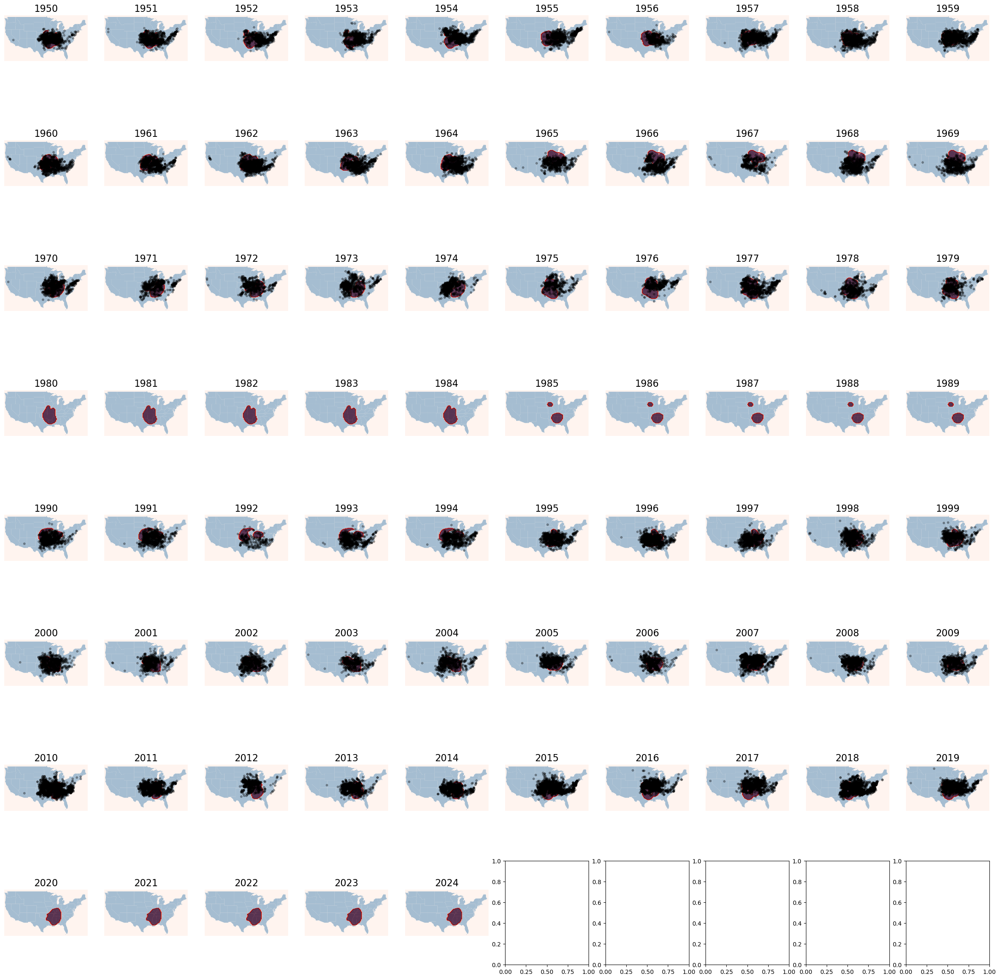

In [ ]:
years = np.arange(1950,2025,1)

fig, axs = plt.subplots(8,10)
fig.set_size_inches(30,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    if year % 10 == 0:
        print('Processing year ' + str(year))
    plot_x = (year - 1950) % 10
    plot_y = (year - 1950) // 10

    density = tornado_kdes(year,positions).reshape(xx.shape)
    tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)

    year_predictions = predictions_df[predictions_df['DATE'] == year]
    year_predictions = year_predictions[year_predictions['predictions'] > 0.5]
 
    pos_pts_x = year_predictions['LONGITUDE'].values
    pos_pts_y = year_predictions['LATITUDE'].values

    ax.scatter(pos_pts_x, pos_pts_y, c='black', s=10, alpha=0.3)

    ax.set_title(str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

Processing year 1950
Processing year 1960
Processing year 1970
Processing year 1980
Processing year 1990
Processing year 2000
Processing year 2010
Processing year 2020


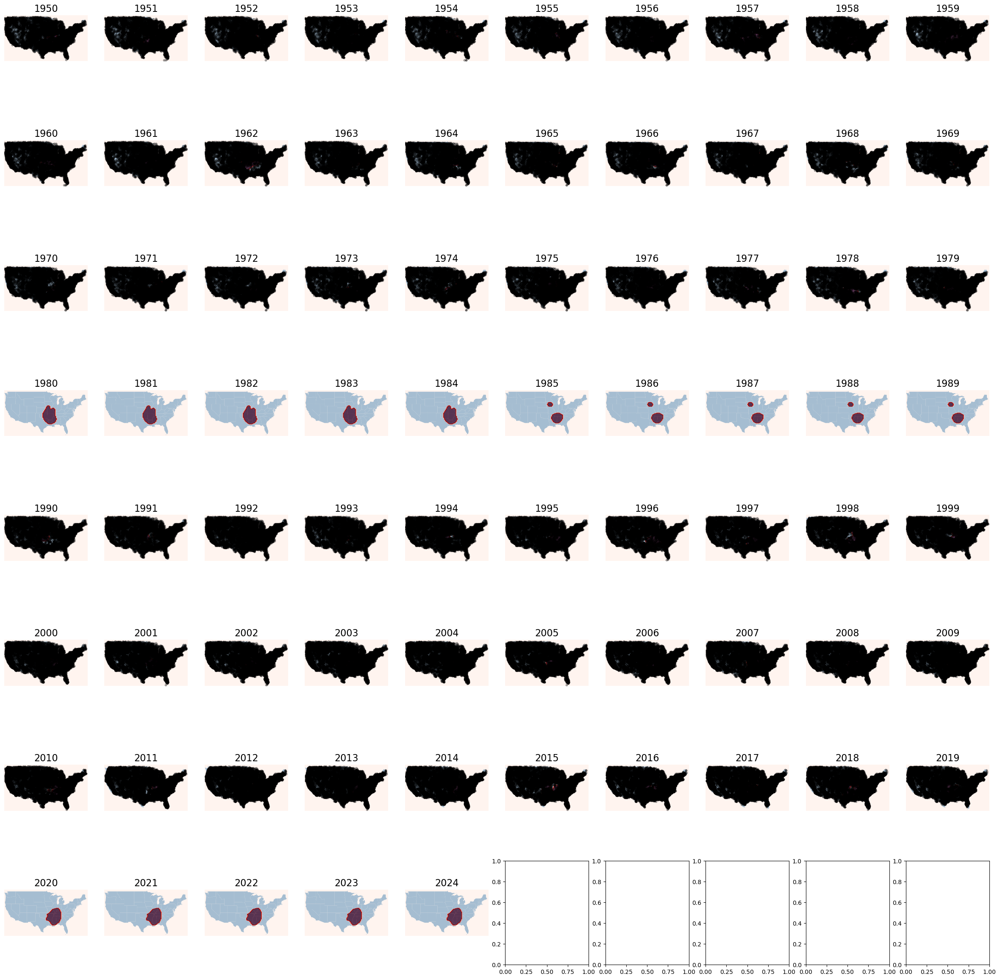

In [29]:
years = np.arange(1950,2025,1)

fig, axs = plt.subplots(8,10)
fig.set_size_inches(30,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    if year % 10 == 0:
        print('Processing year ' + str(year))
    plot_x = (year - 1950) % 10
    plot_y = (year - 1950) // 10

    density = tornado_kdes(year,positions).reshape(xx.shape)
    tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)

    year_predictions = predictions_df[predictions_df['DATE'] == year]
    year_predictions = year_predictions[year_predictions['predictions'] < 0.5]
 
    pos_pts_x = year_predictions['LONGITUDE'].values
    pos_pts_y = year_predictions['LATITUDE'].values

    ax.scatter(pos_pts_x, pos_pts_y, c='black', s=10, alpha=0.3)

    ax.set_title(str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

Processing year 1950
Processing year 1960
Processing year 1970
Processing year 1980
Processing year 1990
Processing year 2000
Processing year 2010
Processing year 2020


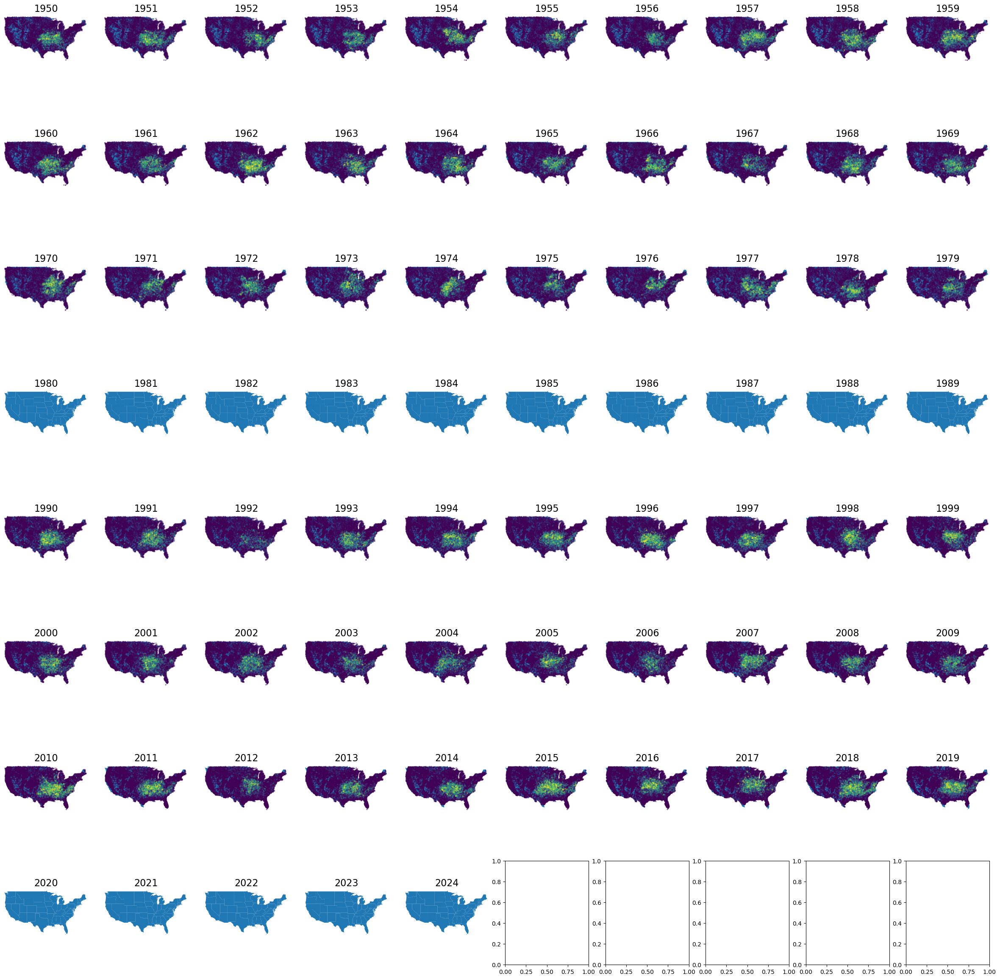

In [30]:
years = np.arange(1950,2025,1)

fig, axs = plt.subplots(8,10)
fig.set_size_inches(30,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    if year % 10 == 0:
        print('Processing year ' + str(year))
    plot_x = (year - 1950) % 10
    plot_y = (year - 1950) // 10

    density = tornado_kdes(year,positions).reshape(xx.shape)
    tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    year_predictions = predictions_df[predictions_df['DATE'] == year]

 
    pos_pts_x = year_predictions['LONGITUDE'].values
    pos_pts_y = year_predictions['LATITUDE'].values

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    ax.scatter(pos_pts_x, pos_pts_y, c=year_predictions['predictions'], s=10, alpha=0.3,marker='.')

    ax.set_title(str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

As it stands, this code assigns classifications to weather stations. Ultimately, though, what we're interested in is classifying land as in or not-in Tornado Alley. As such, let's convolve the predict_proba values with a Gaussian Kernel to obtain a mixture distribution that assigns a probability for each point in the US being in Tornado Alley.

In [31]:
predictions_df

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley,predictions
73244,1950,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1341.735086,104.000000,77.000000,14.000000,0.000000,...,26.067506,12.622880,0.000000,0.000000,0.000000,0.000000,0.000000,30.141174,0,0.0
73245,1957,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1311.032930,95.000000,77.000000,14.000000,0.000000,...,25.515139,13.456971,0.000000,0.000000,0.000000,0.000000,0.000000,32.607199,0,0.0
73246,1958,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1266.894815,90.000000,73.000000,13.000000,0.000000,...,24.575579,11.766309,1.000000,1.000000,25.000000,25.000000,25.000000,35.907665,0,0.4
73247,1959,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1297.643358,96.000000,79.000000,17.000000,0.000000,...,25.029862,12.686546,0.000000,0.000000,0.000000,0.000000,0.000000,10.541029,0,0.2
73322,1950,34.41667,-87.31667,302.1,"ADDISON CENTRAL TOWER, AL US",935.780952,124.129893,83.896073,19.342884,0.000000,...,21.841915,10.787106,1.000000,1.000000,76.000000,76.000000,76.000000,62.732118,1,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680143,2015,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",571.700000,109.000000,67.000000,10.000000,10.000000,...,17.670000,5.470000,21.728947,3.737868,257.913558,70.422663,267.688305,76.145173,0,0.4
680144,2016,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",654.100000,87.000000,52.000000,9.000000,6.000000,...,18.360000,6.310000,24.618878,4.831510,183.668195,155.904403,526.851372,70.522834,0,0.2
680145,2017,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",579.400000,84.000000,57.000000,9.000000,6.000000,...,17.980000,5.540000,15.519591,3.943548,92.827091,83.822394,258.722362,57.792966,0,0.4
680146,2018,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",651.000000,103.000000,66.000000,9.000000,7.000000,...,16.170000,4.380000,50.084134,13.723489,142.883543,162.080228,1060.386763,78.184530,0,0.6


To get clearer visualizations, we need to overcome the nonuniformity of the distribution of weather stations. In that interest, we'll interpolate our data and predictions onto a uniform grid. However, this gives a somewhat unpredictable amount of influence to certain observations. To overcome this issue, and to cause smoother predictions of Tornado Alley, we'll perform a local average on the grid.

Two new parameters are involved here. 
*   DECISION_THRESHOLD specifies the predicted probability level above which a grid point will be considered 'accepted'.
*   AVERAGING_WIDTH specifies the latitude/longitude widths of the Gaussian convolved with the data. Larger values mean that more distant points are averaged at each gridpoint.

Processing year 1950
Processing year 1960
Processing year 1970
Processing year 1980
Processing year 1990
Processing year 2000
Processing year 2010
Processing year 2020


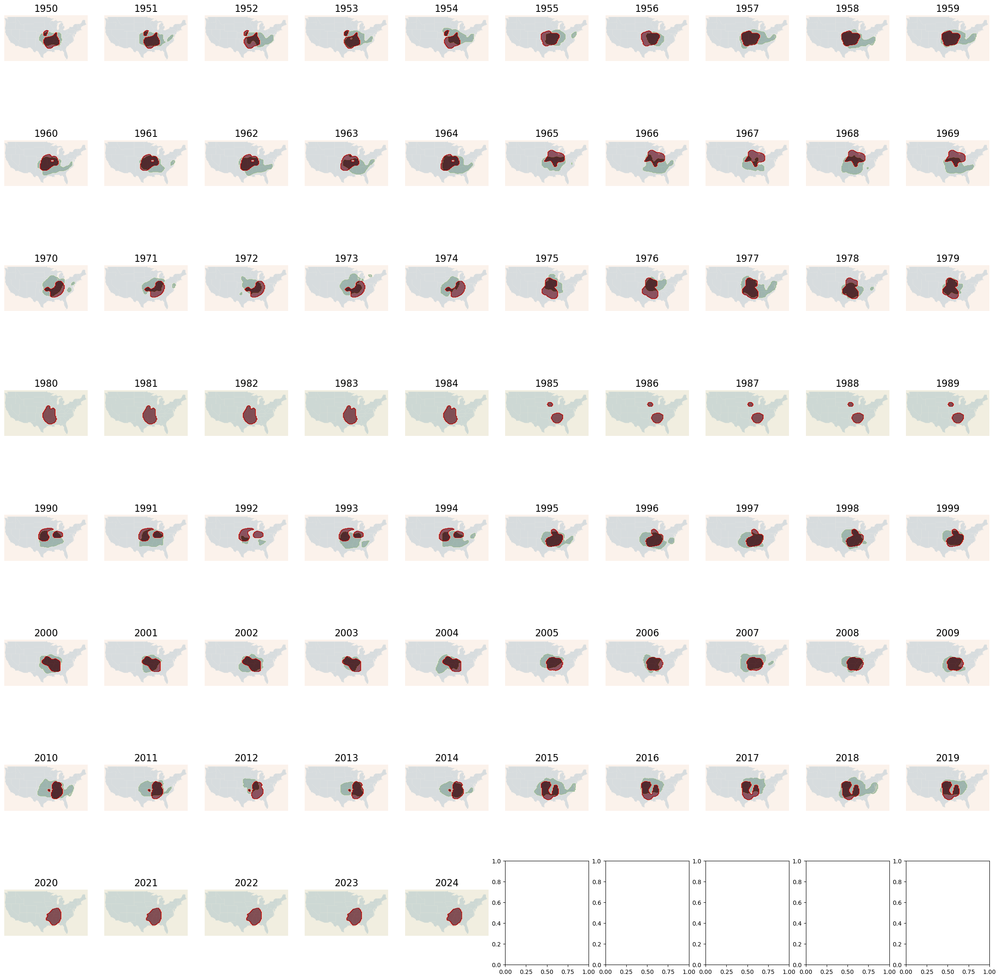

In [32]:
AVERAGING_WIDTH = 1
DECISION_THRESHOLD = .25

years = np.arange(1950,2025,1)

fig, axs = plt.subplots(8,10)
fig.set_size_inches(30,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

grid_pred_df = predictions_to_grid(predictions_df,positions.transpose(),predictions_df['DATE'].unique(),'predictions')

for year in years:
    if year % 10 == 0:
        print('Processing year ' + str(year))
    plot_x = (year - 1950) % 10
    plot_y = (year - 1950) // 10

    year_preds = np.zeros(xx.shape)

    year_df = grid_pred_df[grid_pred_df['DATE'] == year]
    if year_df.shape[0] != 0:
        year_df = average_predicts(year_df, AVERAGING_WIDTH)

        year_preds = np.array(year_df['preds']).reshape(xx.shape)

    pred_tornado_alley = (year_preds > DECISION_THRESHOLD)

    density = tornado_kdes(year,positions).reshape(xx.shape)
    tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, pred_tornado_alley, levels=10, cmap='Greens', alpha=0.6)
    contour = ax.contourf(xx, yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)

    ax.set_title(str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

### Custom Score Functions for Regional Similarity

In [48]:
from region_dist_metrics import *

Initializing the grid:

In [49]:
xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
coords = np.stack([xx,yy],axis=2)

grid_dists_sq = np.zeros((100,100,100,100))
for i in range(100):
    if i % 5 == 0:
        print(i)
    for j in range(100):
        for k in range(100):
            for l in range(100):
                grid_dists_sq[i,j,k,l] = gridpt_dist_sq(coords,(i,j),(k,l))

0
5
10
15
20
25
30
35
40
45
50
55
60
65
70
75
80
85
90
95


Now we need to make a custom scorer callable based on our region difference scorer.

In [50]:
from sklearn.metrics import make_scorer

In [51]:
dist_choice = 'l1'
tornado_alley_list = {}
for year in range(1950,2025):
    density = tornado_kdes(year,positions).reshape(xx.shape)
    tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)
    tornado_alley_list[year] = tornado_alley

In [52]:
def region_score(y,y_pred,predict_df,tornado_alley_list,averaging_width,decision_threshold):
    ''' 
        y - this value is ignored, but needed to fit the framework of a score function
        y_pred - this value is also ignored, but needed to fit the framework of a score function
        predict_df - a dataframe containing 'LATITUDE', 'LONGITUDE', 'DATE', and 'predictions' columns
        tornado_alley_list - a dictionary with each key a year and each value a 2-dimensional array of 0s and 1s, 
            with the 1s identifying the region considered to be Tornado Alley in that year. 
        averaging_width - the latitude/longitude widths of the Gaussian convolved with the grid-interpolated predictions
        decision_threshold - the predicted probability level above which a grid point will be considered 'accepted'.

            The years serving as keys in tornado_alley_list MUST encompass all years present as values in predict_df['DATE']

        Returns a score representing the similarity between the 'ground truth' Tornado Alley and the predicted one, summed over all years.
    '''
    return region_diff(tornado_alley_list,predict_df,grid_dists_sq,positions,averaging_width,decision_threshold,dist_choice)

region_scorer = make_scorer(region_score,greater_is_better=False)

In [70]:
def custom_grid_search_cv(n_neighbors, av_widths, dec_threshs):
    ''' 
        A re-implementation of GridSearchCV, needed so that we can explore parameters within the region_score function as well as in the estimator.
        n_neighbors is a a list of values to test for num_neighbors in a kNN model
        av_widths and dec_threshs are lists of values to test for average_widths and decision_thresholds
    '''
    scores = {}
    for n in n_neighbors:
        pipe = KNeighborsClassifier(n_neighbors=n)
        for averaging_width in av_widths:
            for decision_threshold in dec_threshs:
                print('Processing parameters (' + str(n) + ',' + str(averaging_width) + ',' + str(decision_threshold) + ')')
                train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
                cv_scores = []
                for train_indices,test_indices in cv_splits:
                    train_data = remaining_kde_df.iloc[train_indices]
                    test_data = remaining_kde_df.iloc[test_indices].copy()
                    pipe.fit(train_data[features],train_data['tornado_alley'])
                    test_predicts = pipe.predict_proba(test_data[features])
                    test_data['predictions'] = test_predicts[:,1]

                    new_score = region_score(0,0,test_data,tornado_alley_list,averaging_width,decision_threshold)
                    cv_scores.append(new_score)

                    if new_score == np.nan:
                        break

                score = np.mean(cv_scores)
                scores[(n,averaging_width,decision_threshold)] = score
                print('Score: ' + str(score))
    return scores

##### Parameter Searching

We don't recommend rerunning the below cells unless strictly necessary. It takes some time to complete. Some further optimization could be done to handle cases where predicted regions are empty, but what's present suffices to give them NaN scores, which we can simplify decide not to pick. In addition, if this is rerun, scores will appear much lower, as we now compute the average score per year, rather than the total over all years. All else is the same.

In [ ]:
score = custom_grid_search_cv(range(5,15),np.linspace(0,1,5),np.linspace(.2,.6,3))

Processing parameters (5,0.0,0.2)
Score: 30.75630181952489
Processing parameters (5,0.0,0.4)
Score: 25.548137207079506
Processing parameters (5,0.0,0.6)
Score: 26.19083838139657
Processing parameters (5,0.25,0.2)
Score: 29.297352378541145
Processing parameters (5,0.25,0.4)
Score: 25.3529799917421
Processing parameters (5,0.25,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (5,0.5,0.2)
Score: 27.89493531815039
Processing parameters (5,0.5,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (5,0.5,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (5,0.75,0.2)
Score: 27.150659330727677
Processing parameters (5,0.75,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (5,0.75,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (5,1.0,0.2)
Score: 26.077437846498622
Processing parameters (5,1.0,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (5,1.0,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (6,0.0,0.2)
Score: 30.7047828161236
Processing parameters (6,0.0,0.4)
Score: 25.78719691699558
Processing parameters (6,0.0,0.6)
Score: 27.087149879549084
Processing parameters (6,0.25,0.2)
Score: 29.028295592677733
Processing parameters (6,0.25,0.4)
Score: 25.694656840587317
Processing parameters (6,0.25,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (6,0.5,0.2)
Score: 27.6791771408141
Processing parameters (6,0.5,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (6,0.5,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (6,0.75,0.2)
Score: 27.082305802850147
Processing parameters (6,0.75,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (6,0.75,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (6,1.0,0.2)
Score: 25.941029496255307
Processing parameters (6,1.0,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (6,1.0,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (7,0.0,0.2)
Score: 30.26958438414475
Processing parameters (7,0.0,0.4)
Score: 25.40282921887599
Processing parameters (7,0.0,0.6)
Score: 27.212415402499584
Processing parameters (7,0.25,0.2)
Score: 28.666529540037327
Processing parameters (7,0.25,0.4)
Score: 25.873654368307545
Processing parameters (7,0.25,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (7,0.5,0.2)
Score: 27.548910755616955
Processing parameters (7,0.5,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (7,0.5,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (7,0.75,0.2)
Score: 26.816918562780003
Processing parameters (7,0.75,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (7,0.75,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (7,1.0,0.2)
Score: 25.8205445385052
Processing parameters (7,1.0,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (7,1.0,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (8,0.0,0.2)
Score: 30.13910494304518
Processing parameters (8,0.0,0.4)
Score: 25.24288748688483
Processing parameters (8,0.0,0.6)
Score: 27.63171736365022
Processing parameters (8,0.25,0.2)
Score: 28.63741742598019
Processing parameters (8,0.25,0.4)
Score: 25.77613698719162
Processing parameters (8,0.25,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (8,0.5,0.2)
Score: 27.223842659058466
Processing parameters (8,0.5,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (8,0.5,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (8,0.75,0.2)
Score: 26.507413659142824
Processing parameters (8,0.75,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (8,0.75,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (8,1.0,0.2)
Score: 25.52016674857218
Processing parameters (8,1.0,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (8,1.0,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (9,0.0,0.2)
Score: 29.426208377526702
Processing parameters (9,0.0,0.4)
Score: 25.24333231813192
Processing parameters (9,0.0,0.6)
Score: 27.315439654197828
Processing parameters (9,0.25,0.2)
Score: 28.048116544745444
Processing parameters (9,0.25,0.4)
Score: 25.69453683702132
Processing parameters (9,0.25,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (9,0.5,0.2)
Score: 26.797453650026643
Processing parameters (9,0.5,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (9,0.5,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (9,0.75,0.2)
Score: 26.038084094693815
Processing parameters (9,0.75,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (9,0.75,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (9,1.0,0.2)
Score: 25.00052470925033
Processing parameters (9,1.0,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (9,1.0,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (10,0.0,0.2)
Score: 29.045482951388816
Processing parameters (10,0.0,0.4)
Score: 25.357580667861317
Processing parameters (10,0.0,0.6)
Score: 27.8953130980114
Processing parameters (10,0.25,0.2)
Score: 27.567649825812623
Processing parameters (10,0.25,0.4)
Score: 25.44454529575044
Processing parameters (10,0.25,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (10,0.5,0.2)
Score: 26.390579037106374
Processing parameters (10,0.5,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (10,0.5,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (10,0.75,0.2)
Score: 25.972978447181003
Processing parameters (10,0.75,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (10,0.75,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (10,1.0,0.2)
Score: 24.92468839074377
Processing parameters (10,1.0,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (10,1.0,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (11,0.0,0.2)
Score: 29.079295249830484
Processing parameters (11,0.0,0.4)
Score: 25.252793277806276
Processing parameters (11,0.0,0.6)
Score: 28.351929805745183
Processing parameters (11,0.25,0.2)
Score: 27.77245009636792
Processing parameters (11,0.25,0.4)
Score: 25.884948888447884
Processing parameters (11,0.25,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (11,0.5,0.2)
Score: 26.586606515888587
Processing parameters (11,0.5,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (11,0.5,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (11,0.75,0.2)
Score: 26.112989065597876
Processing parameters (11,0.75,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (11,0.75,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (11,1.0,0.2)
Score: 25.199226062840726
Processing parameters (11,1.0,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (11,1.0,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (12,0.0,0.2)
Score: 28.836602127741898
Processing parameters (12,0.0,0.4)
Score: 25.131756903955573
Processing parameters (12,0.0,0.6)
Score: 29.679024057594813
Processing parameters (12,0.25,0.2)
Score: 27.83485796132079
Processing parameters (12,0.25,0.4)
Score: 25.588732552829853
Processing parameters (12,0.25,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (12,0.5,0.2)
Score: 26.659653537424674
Processing parameters (12,0.5,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (12,0.5,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (12,0.75,0.2)
Score: 26.058322637052854
Processing parameters (12,0.75,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (12,0.75,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (12,1.0,0.2)
Score: 25.109603701210713
Processing parameters (12,1.0,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (12,1.0,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (13,0.0,0.2)
Score: 28.732432713318364
Processing parameters (13,0.0,0.4)
Score: 25.18743095737368
Processing parameters (13,0.0,0.6)
Score: 29.625559942507582
Processing parameters (13,0.25,0.2)
Score: 27.647430624977073
Processing parameters (13,0.25,0.4)
Score: 25.60463436654061
Processing parameters (13,0.25,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (13,0.5,0.2)
Score: 26.544269372249587
Processing parameters (13,0.5,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (13,0.5,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (13,0.75,0.2)
Score: 25.97160529611673
Processing parameters (13,0.75,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (13,0.75,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (13,1.0,0.2)
Score: 24.98802208039244
Processing parameters (13,1.0,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (13,1.0,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (14,0.0,0.2)
Score: 28.687935347018623
Processing parameters (14,0.0,0.4)
Score: 25.165575604660447
Processing parameters (14,0.0,0.6)
Score: 29.689071316927883
Processing parameters (14,0.25,0.2)
Score: 27.835056621969102
Processing parameters (14,0.25,0.4)
Score: 26.207823254336517
Processing parameters (14,0.25,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (14,0.5,0.2)
Score: 26.643216226553744
Processing parameters (14,0.5,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (14,0.5,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (14,0.75,0.2)
Score: 26.112725643817686
Processing parameters (14,0.75,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (14,0.75,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (14,1.0,0.2)
Score: 25.203930806097986
Processing parameters (14,1.0,0.4)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (14,1.0,0.6)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan


In [69]:
new_scores = custom_grid_search_cv(range(8,12),np.linspace(.5,1.5,4),np.linspace(.15,.3,3))

Processing parameters (8,0.5,0.15)
Score: 29.98743110490656
Processing parameters (8,0.5,0.22499999999999998)
Score: 26.023075887297324
Processing parameters (8,0.5,0.3)
Score: 25.192610764428654
Processing parameters (8,0.8333333333333333,0.15)
Score: 29.001207204041624
Processing parameters (8,0.8333333333333333,0.22499999999999998)
Score: 24.8197059572954
Processing parameters (8,0.8333333333333333,0.3)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (8,1.1666666666666665,0.15)
Score: 28.139685782967607
Processing parameters (8,1.1666666666666665,0.22499999999999998)
Score: 23.653988674280356
Processing parameters (8,1.1666666666666665,0.3)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (8,1.5,0.15)
Score: 27.194610173143506
Processing parameters (8,1.5,0.22499999999999998)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (8,1.5,0.3)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (9,0.5,0.15)
Score: 29.57901440884743
Processing parameters (9,0.5,0.22499999999999998)
Score: 25.70244065845566
Processing parameters (9,0.5,0.3)
Score: 25.029189208164468
Processing parameters (9,0.8333333333333333,0.15)
Score: 28.454529929037495
Processing parameters (9,0.8333333333333333,0.22499999999999998)
Score: 24.68068791488145
Processing parameters (9,0.8333333333333333,0.3)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (9,1.1666666666666665,0.15)
Score: 27.873467755261775
Processing parameters (9,1.1666666666666665,0.22499999999999998)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (9,1.1666666666666665,0.3)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (9,1.5,0.15)
Score: 26.922449372727034
Processing parameters (9,1.5,0.22499999999999998)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (9,1.5,0.3)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (10,0.5,0.15)
Score: 29.560101103575153
Processing parameters (10,0.5,0.22499999999999998)
Score: 25.768900714880015
Processing parameters (10,0.5,0.3)
Score: 24.82697945253193
Processing parameters (10,0.8333333333333333,0.15)
Score: 28.46970984207594
Processing parameters (10,0.8333333333333333,0.22499999999999998)
Score: 24.652788175837316
Processing parameters (10,0.8333333333333333,0.3)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (10,1.1666666666666665,0.15)
Score: 27.838886365229726
Processing parameters (10,1.1666666666666665,0.22499999999999998)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (10,1.1666666666666665,0.3)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (10,1.5,0.15)
Score: 26.762913423634632
Processing parameters (10,1.5,0.22499999999999998)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (10,1.5,0.3)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (11,0.5,0.15)
Score: 29.494897794392042
Processing parameters (11,0.5,0.22499999999999998)
Score: 25.912155771504256
Processing parameters (11,0.5,0.3)
Score: 25.202470059269917
Processing parameters (11,0.8333333333333333,0.15)
Score: 28.426141183691385
Processing parameters (11,0.8333333333333333,0.22499999999999998)
Score: 24.836495888138575
Processing parameters (11,0.8333333333333333,0.3)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (11,1.1666666666666665,0.15)
Score: 27.798875186339274
Processing parameters (11,1.1666666666666665,0.22499999999999998)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (11,1.1666666666666665,0.3)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan
Processing parameters (11,1.5,0.15)
Score: 26.76986412135002
Processing parameters (11,1.5,0.22499999999999998)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)


Score: nan
Processing parameters (11,1.5,0.3)


c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divide
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: All-NaN slice encountered
  return np.nansum(np.sqrt(np.nanmin(grid_dists_sq*region2,axis=(2,3))*region1)) / region_size(region1)
c:\Users\Matthew Dannenberg\Desktop\ErdosInstitute\not_in_kansas_anymore\climate_tornado_model\region_dist_metrics.py:53: RuntimeWarning: invalid value encountered in scalar divid

Score: nan


In [71]:
score.update(new_scores)

##### Examining Scores

In [72]:
score

{(5, np.float64(0.0), np.float64(0.2)): np.float64(30.75630181952489),
 (5, np.float64(0.0), np.float64(0.4)): np.float64(25.548137207079506),
 (5, np.float64(0.0), np.float64(0.6)): np.float64(26.19083838139657),
 (5, np.float64(0.25), np.float64(0.2)): np.float64(29.297352378541145),
 (5, np.float64(0.25), np.float64(0.4)): np.float64(25.3529799917421),
 (5, np.float64(0.25), np.float64(0.6)): np.float64(nan),
 (5, np.float64(0.5), np.float64(0.2)): np.float64(27.89493531815039),
 (5, np.float64(0.5), np.float64(0.4)): np.float64(nan),
 (5, np.float64(0.5), np.float64(0.6)): np.float64(nan),
 (5, np.float64(0.75), np.float64(0.2)): np.float64(27.150659330727677),
 (5, np.float64(0.75), np.float64(0.4)): np.float64(nan),
 (5, np.float64(0.75), np.float64(0.6)): np.float64(nan),
 (5, np.float64(1.0), np.float64(0.2)): np.float64(26.077437846498622),
 (5, np.float64(1.0), np.float64(0.4)): np.float64(nan),
 (5, np.float64(1.0), np.float64(0.6)): np.float64(nan),
 (6, np.float64(0.0), np

More detailed parameter searches could be carried out, but given the run-time and some experimental evidence that suggests relatively little further improvement is likely to be achieved, we'll halt here and use the currently optimal parameters.

In [73]:
best = min(x for x in score if score[x] == min(score[x] for x in score))
print("Best Parameters Found: " + str(best))
print("Best Score: " + str(score[best]))

Best Parameters Found: (8, np.float64(1.1666666666666665), np.float64(0.22499999999999998))
Best Score: 23.653988674280356


### The Main Train-Test Split

In [74]:
num_neighbors = 10
AVERAGING_WIDTH = 1.1666666666666665
DECISION_THRESHOLD = 0.22499999999999998

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features_to_interpolate)



knn_pipe = make_pipeline(StandardScaler(),KNeighborsClassifier(n_neighbors=num_neighbors,weights='distance'))
knn_pipe.fit(train_df[features],train_df['tornado_alley'])
test_predicts = knn_pipe.predict_proba(test_df[features])
test_df['predictions'] = test_predicts[:,1]
test_df['binary_predictions'] = knn_pipe.predict(test_df[features])

predictions_df = test_df.copy()

C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_14468\339405964.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['predictions'] = test_predicts[:,1]
C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_14468\339405964.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['binary_predictions'] = knn_pipe.predict(test_df[features])


In [75]:
f1_score(test_df['tornado_alley'],test_df['binary_predictions'])

0.3231625563726486

Now we can score the regional differences.

In [76]:
region_score([],[],predictions_df,tornado_alley_list,AVERAGING_WIDTH,DECISION_THRESHOLD)

np.float64(34.08545557177432)

In [77]:
def ground_truth_classification_plot(predict_df,year,grid_xx,grid_yy,tornado_alley,ax):
    states.plot(ax=ax)

    ax.contourf(grid_xx, grid_yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)

    tornado_x = tornado_df[tornado_df['year_bin']==year]['begin_lon'].values
    tornado_y = tornado_df[tornado_df['year_bin']==year]['begin_lat'].values
    ax.scatter(tornado_x, tornado_y, c='black', s=10, alpha=0.3)

    ax.set_title(str(year) + " F3–F5 Tornadoes and Tornado Alley", fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    return ax

def accepted_pt_classification_plot(predict_df,year,grid_xx,grid_yy,tornado_alley,ax):
    states.plot(ax=ax)

    contour = ax.contourf(grid_xx, grid_yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)
    year_predictions = predict_df[predict_df['DATE'] == year]
    year_predictions = year_predictions[year_predictions['predictions'] > 0.5]

    pos_pts_x = year_predictions['LONGITUDE'].values
    pos_pts_y = year_predictions['LATITUDE'].values

    ax.scatter(pos_pts_x, pos_pts_y, c='black', s=10, alpha=0.3)

    ax.set_title(str(year) + " Accepted Weather Stations", fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    return ax

def predict_tornado_alley_classification_plot(grid_predict_df,year,grid_xx,grid_yy,grid_positions,ax):
    year_df = grid_predict_df[grid_predict_df['DATE'] == year]
    year_df = average_predicts(year_df, AVERAGING_WIDTH)

    year_preds = np.array(year_df['preds']).reshape(xx.shape)

    tornado_alley = (year_preds > DECISION_THRESHOLD)

    states.plot(ax=ax)

    contour = ax.contourf(grid_xx, grid_yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)

    ax.set_title(str(year) + ' Predicted Tornado Alley', fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    return ax

def classification_year_plot(predict_df,year,grid_xx,grid_yy,grid_positions):
    
    density = tornado_kdes(year,grid_positions).reshape(grid_xx.shape)
    tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    ground_truth_classification_plot(predict_df,year,grid_xx,grid_yy,tornado_alley,axs[0])
    accepted_pt_classification_plot(predict_df,year,grid_xx,grid_yy,tornado_alley,axs[1])

    grid_pred_df = predictions_to_grid(predict_df,positions.transpose(),[year],'predictions')
    predict_tornado_alley_classification_plot(grid_pred_df,year,grid_xx,grid_yy,grid_positions,axs[2])

    return (fig, axs)

In [78]:
years = list(range(1980,1990)) + list(range(2020,2025))

plt.ioff()

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    fig, axs = plt.subplots(1,3,figsize=(30,10))
    fig, axs = classification_year_plot(predictions_df, year, xx, yy, positions)
    fig.savefig('generated_images/classification_' + str(year) + '.png')

In [79]:
plt.ion()

### Trends in the Mean Location of Predicted Regions

In [82]:
def center_of_mass_predicted_classification_region(predict_df,grid_xx,grid_yy,grid_positions,year):
    density = tornado_kdes(year,grid_positions).reshape(grid_xx.shape)
    tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    grid_pred_df = predictions_to_grid(predict_df,grid_positions.transpose(),[year],'predictions')

    year_df = grid_pred_df[grid_pred_df['DATE'] == year]
    year_df = average_predicts(year_df, AVERAGING_WIDTH)

    year_preds = np.array(year_df['preds']).reshape(xx.shape)

    tornado_alley = (year_preds > DECISION_THRESHOLD)

    mean_x = np.sum(xx * tornado_alley)/np.sum(tornado_alley)
    mean_y = np.sum(yy * tornado_alley)/np.sum(tornado_alley)

    return (mean_x, mean_y)

In [83]:
AVERAGING_WIDTH = 1
DECISION_THRESHOLD = .4

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:200j, ymin:ymax:200j]
positions = np.vstack([xx.ravel(), yy.ravel()])

xmeans = []
ymeans = []
for year in years:
    x,y = center_of_mass_predicted_classification_region(predictions_df,xx,yy,positions,year)
    xmeans.append(x)
    ymeans.append(y)

mean_classification_df = pd.DataFrame()
mean_classification_df['year'] = years
mean_classification_df['xmean'] = xmeans
mean_classification_df['ymean'] = ymeans

mean_classification_df

,year,xmean,ymean
0,1980,-88.238954,35.332338
1,1981,-92.404315,39.015665
2,1982,-92.235543,35.820536
3,1983,-90.373211,35.870156
4,1984,-92.693037,36.256587
5,1985,-93.834584,35.155094
6,1986,-92.400549,36.907866
7,1987,-93.136913,37.567505
8,1988,-91.199624,36.674671
9,1989,-92.701787,35.491147


C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_14468\2355857082.py:12: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


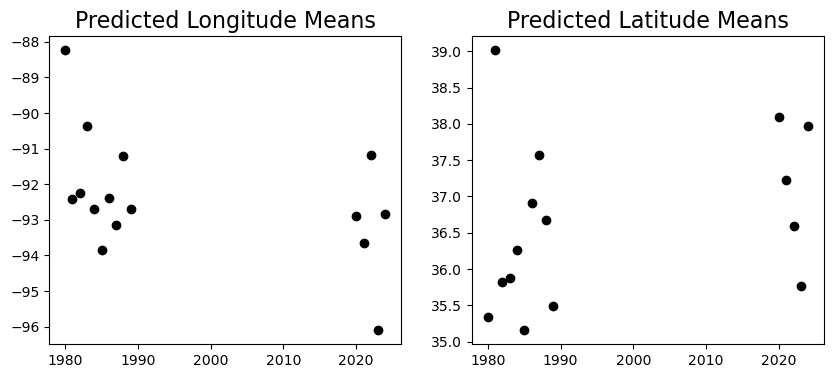

In [84]:
fig, axs = plt.subplots(1,2,figsize=(10,4))
ax0 = axs[0]
ax1 = axs[1]

ax0.scatter(mean_classification_df['year'],mean_classification_df['xmean'],c='black')
ax0.set_title('Predicted Longitude Means', fontsize=16)

ax1.scatter(mean_classification_df['year'],mean_classification_df['ymean'],c='black')
ax1.set_title('Predicted Latitude Means', fontsize=16)


fig.show()